PRE-PROCESSING AUDIO DATA

In [63]:
#Importing Libraries

import numpy as np
import librosa, librosa.display
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow.keras as keras
import json
import os
import math
import random
import IPython



Mount Google Drive

In [64]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Locate the File in Google Drive

In [65]:
Path = 'drive/My Drive/Dataset' 

In [66]:
# load audio file with Librosa

FIG_SIZE = (15,10)
file = Path + '/genres_original/blues/blues.00000.wav'
signal, sample_rate = librosa.load(file, sr=22050)

Text(0.5, 1.0, 'Waveform')

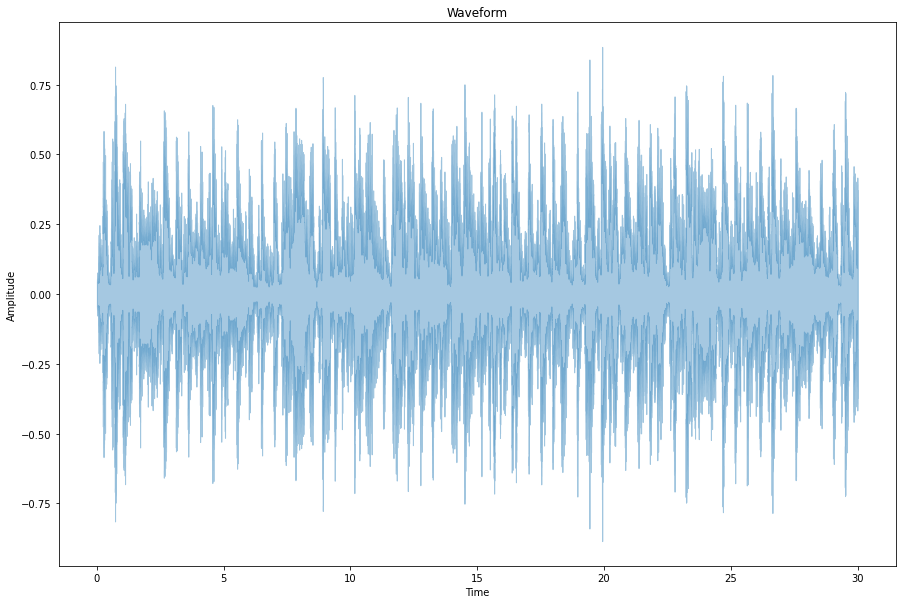

In [67]:
# WAVEFORM
# display waveform

plt.figure(figsize=FIG_SIZE)
librosa.display.waveshow(signal, sample_rate, alpha=0.4)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.title("Waveform")

In [68]:
# FFT -> power spectrum
# perform Fourier transform

fft = np.fft.fft(signal)

In [69]:
# calculate abs values on complex numbers to get magnitude

spectrum = np.abs(fft)

In [70]:
# create frequency variable

f = np.linspace(0, sample_rate, len(spectrum))

Text(0.5, 1.0, 'Power Spectrum')

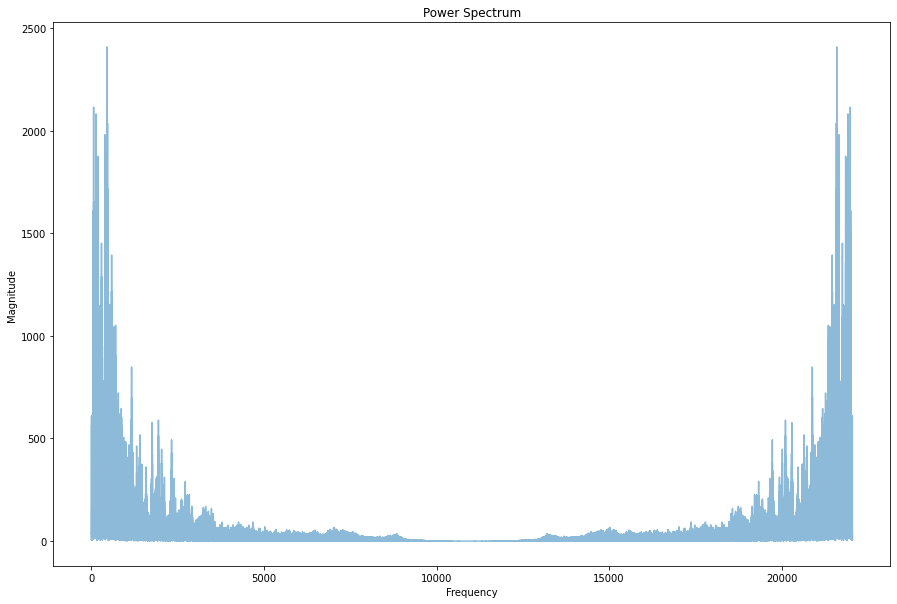

In [71]:
# Plot Spectrum

plt.figure(figsize=FIG_SIZE)
plt.plot(f, spectrum, alpha=0.5)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Power Spectrum")

In [72]:
# take half of the spectrum and frequency

left_spectrum = spectrum[:int(len(spectrum)/2)]
left_f = f[:int(len(spectrum)/2)]

Text(0.5, 1.0, 'Power spectrum')

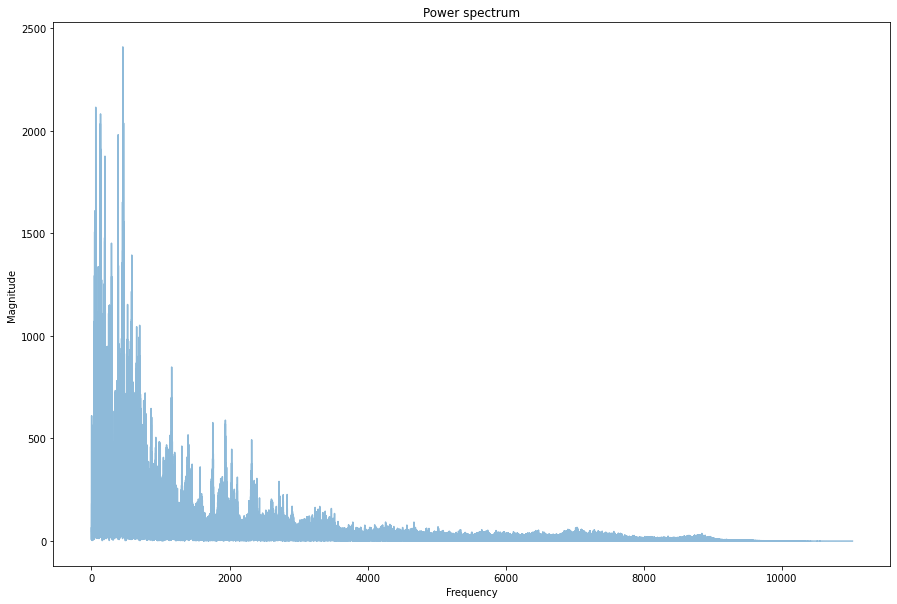

In [73]:
# plot spectrum

plt.figure(figsize=FIG_SIZE)
plt.plot(left_f, left_spectrum, alpha=0.5)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Power spectrum")

In [74]:
# STFT -> spectrogram

hop_length = 512 # in num. of samples
n_fft = 2048 # window in num. of samples


In [75]:
# calculate duration hop length and window in seconds

hop_length_duration = float(hop_length)/sample_rate
n_fft_duration = float(n_fft)/sample_rate
print("STFT hop length duration is: {}s".format(hop_length_duration))
print("STFT window duration is: {}s".format(n_fft_duration))

STFT hop length duration is: 0.023219954648526078s
STFT window duration is: 0.09287981859410431s


In [76]:
# perform stft
stft = librosa.stft(signal, n_fft=n_fft, hop_length=hop_length)

In [77]:
# calculate abs values on complex numbers to get magnitude
spectrogram = np.abs(stft)

Text(0.5, 1.0, 'Spectrogram')

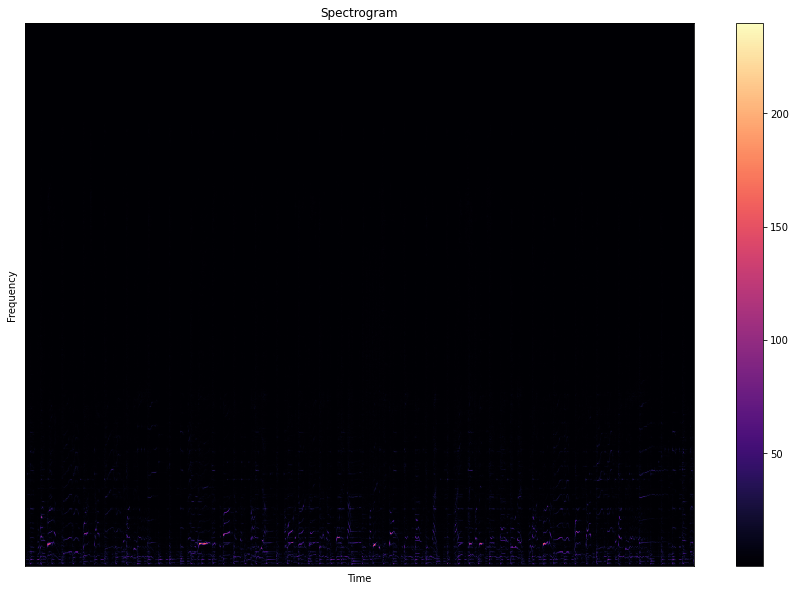

In [78]:
# display spectrogram

plt.figure(figsize=FIG_SIZE)
librosa.display.specshow(spectrogram, sr=sample_rate, hop_length=hop_length)
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar()
plt.title("Spectrogram")

In [79]:
# apply logarithm to cast amplitude to Decibels

log_spectrogram = librosa.amplitude_to_db(spectrogram)


Text(0.5, 1.0, 'Spectrogram (dB)')

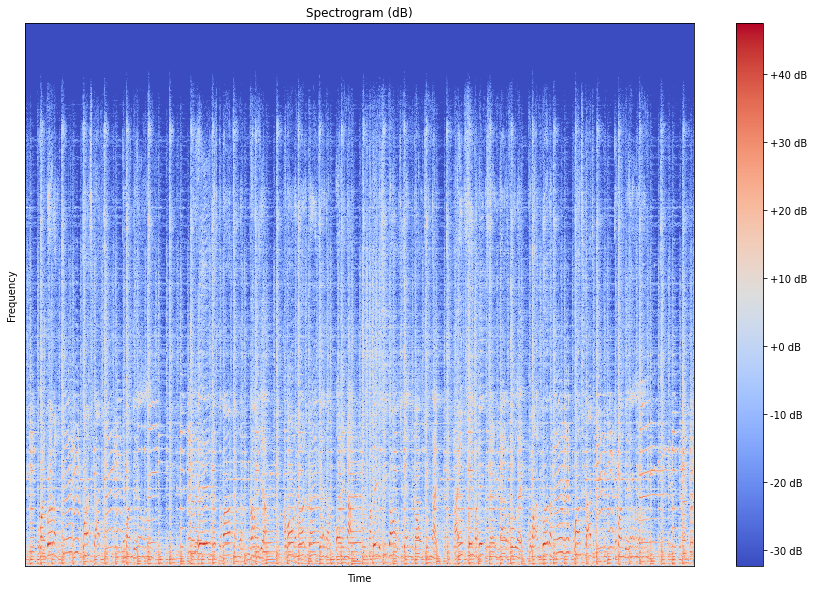

In [80]:
# Plot the Spectrogram in Decibels

plt.figure(figsize=FIG_SIZE)
librosa.display.specshow(log_spectrogram, sr=sample_rate, hop_length=hop_length)
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar(format="%+2.0f dB")
plt.title("Spectrogram (dB)")

In [81]:
# MFCCs
# extract 13 MFCCs
MFCCs = librosa.feature.mfcc(signal, sample_rate, n_fft=n_fft, hop_length=hop_length, n_mfcc=13)

Text(0.5, 1.0, 'MFCCs')

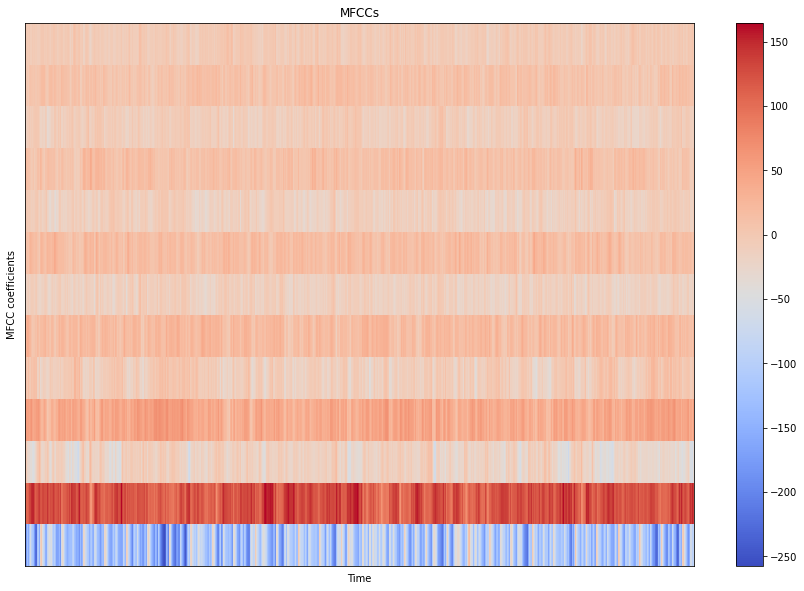

In [82]:
# display MFCCs
plt.figure(figsize=FIG_SIZE)
librosa.display.specshow(MFCCs, sr=sample_rate, hop_length=hop_length)
plt.xlabel("Time")
plt.ylabel("MFCC coefficients")
plt.colorbar()
plt.title("MFCCs")

DATA EXTRACTION

In [83]:
DATASET_PATH = Path + '/genres_original'
JSON_PATH = 'data_10.json'
SAMPLE_RATE = 22050
TRACK_DURATION = 30 # measured in seconds
SAMPLES_PER_TRACK = SAMPLE_RATE * TRACK_DURATION


In [84]:
def save_mfcc(dataset_path, json_path, num_mfcc=13, n_fft=2048, hop_length=512, num_segments=5):
    """Extracts MFCCs from music dataset and saves them into a json file along witgh genre labels.
        :param dataset_path (str): Path to dataset
        :param json_path (str): Path to json file used to save MFCCs
        :param num_mfcc (int): Number of coefficients to extract
        :param n_fft (int): Interval we consider to apply FFT. Measured in # of samples
        :param hop_length (int): Sliding window for FFT. Measured in # of samples
        :param: num_segments (int): Number of segments we want to divide sample tracks into
        :return:
        """

    # dictionary to store mapping, labels, and MFCCs
    data = {
        "mapping": [],
        "labels": [],
        "mfcc": []
    }

    samples_per_segment = int(SAMPLES_PER_TRACK / num_segments)
    num_mfcc_vectors_per_segment = math.ceil(samples_per_segment / hop_length)

    # loop through all genre sub-folder
    for i, (dirpath, dirnames, filenames) in enumerate(os.walk(dataset_path)):

        # ensure we're processing a genre sub-folder level
        if dirpath is not dataset_path:

            # save genre label (i.e., sub-folder name) in the mapping
            semantic_label = dirpath.split("/")[-1]
            data["mapping"].append(semantic_label)
            print("\nProcessing: {}".format(semantic_label))

            # process all audio files in genre sub-dir
            for f in filenames:

		# load audio file
                file_path = os.path.join(dirpath, f)
                signal, sample_rate = librosa.load(file_path, sr=SAMPLE_RATE)

                # process all segments of audio file
                for d in range(num_segments):

                    # calculate start and finish sample for current segment
                    start = samples_per_segment * d
                    finish = start + samples_per_segment

                    # extract mfcc
                    mfcc = librosa.feature.mfcc(signal[start:finish], sample_rate, n_mfcc=num_mfcc, n_fft=n_fft, hop_length=hop_length)
                    mfcc = mfcc.T

                    # store only mfcc feature with expected number of vectors
                    if len(mfcc) == num_mfcc_vectors_per_segment:
                        data["mfcc"].append(mfcc.tolist())
                        data["labels"].append(i-1)
                        print("{}, segment:{}".format(file_path, d+1))

    # save MFCCs to json file
    with open(json_path, "w") as fp:
        json.dump(data, fp, indent=4)
        

In [85]:
save_mfcc(DATASET_PATH, JSON_PATH, num_segments=10)

Streaming output truncated to the last 5000 lines.
drive/My Drive/Dataset/genres_original/country/country.00001.wav, segment:7
drive/My Drive/Dataset/genres_original/country/country.00001.wav, segment:8
drive/My Drive/Dataset/genres_original/country/country.00001.wav, segment:9
drive/My Drive/Dataset/genres_original/country/country.00001.wav, segment:10
drive/My Drive/Dataset/genres_original/country/country.00000.wav, segment:1
drive/My Drive/Dataset/genres_original/country/country.00000.wav, segment:2
drive/My Drive/Dataset/genres_original/country/country.00000.wav, segment:3
drive/My Drive/Dataset/genres_original/country/country.00000.wav, segment:4
drive/My Drive/Dataset/genres_original/country/country.00000.wav, segment:5
drive/My Drive/Dataset/genres_original/country/country.00000.wav, segment:6
drive/My Drive/Dataset/genres_original/country/country.00000.wav, segment:7
drive/My Drive/Dataset/genres_original/country/country.00000.wav, segment:8
drive/My Drive/Dataset/genres_origin

CNN GENRE CLASSIFIER

In [86]:
DATA_PATH = '/content/data_10.json'

In [87]:
def load_data(data_path):
    """Loads training dataset from json file.
        :param data_path (str): Path to json file containing data
        :return X (ndarray): Inputs
        :return y (ndarray): Targets
    """

    with open(data_path, "r") as f:
        data = json.load(f)

    # convert lists to numpy arrays
    X = np.array(data["mfcc"])
    y = np.array(data["labels"])

    print("Data succesfully loaded!")

    return  X, y

In [88]:
def plot_history(history):
    """Plots accuracy/loss for training/validation set as a function of the epochs
        :param history: Training history of model
        :return:
    """

    fig, axs = plt.subplots(2)

    # create accuracy sublpot
    axs[0].plot(history.history["accuracy"], label="train accuracy")
    axs[0].plot(history.history["val_accuracy"], label="test accuracy")
    axs[0].set_ylabel("Accuracy")
    axs[0].legend(loc="lower right")
    axs[0].set_title("Accuracy eval")

    # create error sublpot
    axs[1].plot(history.history["loss"], label="train error")
    axs[1].plot(history.history["val_loss"], label="test error")
    axs[1].set_ylabel("Error")
    axs[1].set_xlabel("Epoch")
    axs[1].legend(loc="upper right")
    axs[1].set_title("Error eval")

    plt.show()

In [89]:
def prepare_datasets(test_size, validation_size):
    """Loads data and splits it into train, validation and test sets.
    :param test_size (float): Value in [0, 1] indicating percentage of data set to allocate to test split
    :param validation_size (float): Value in [0, 1] indicating percentage of train set to allocate to validation split
    :return X_train (ndarray): Input training set
    :return X_validation (ndarray): Input validation set
    :return X_test (ndarray): Input test set
    :return y_train (ndarray): Target training set
    :return y_validation (ndarray): Target validation set
    :return y_test (ndarray): Target test set
    """

    # load data
    X, y = load_data(DATA_PATH)

    # create train, validation and test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size)
    X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=validation_size)

    # add an axis to input sets
    X_train = X_train[..., np.newaxis]
    X_validation = X_validation[..., np.newaxis]
    X_test = X_test[..., np.newaxis]

    return X_train, X_validation, X_test, y_train, y_validation, y_test

In [90]:
def build_model(input_shape):
    """Generates CNN model
    :param input_shape (tuple): Shape of input set
    :return model: CNN model
    """

    # build network topology
    model = keras.Sequential()

    # 1st conv layer
    model.add(keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same'))
    model.add(keras.layers.BatchNormalization())

    # 2nd conv layer
    model.add(keras.layers.Conv2D(32, (3, 3), activation='relu'))
    model.add(keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same'))
    model.add(keras.layers.BatchNormalization())

    # 3rd conv layer
    model.add(keras.layers.Conv2D(32, (2, 2), activation='relu'))
    model.add(keras.layers.MaxPooling2D((2, 2), strides=(2, 2), padding='same'))
    model.add(keras.layers.BatchNormalization())

    # flatten output and feed it into dense layer
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(64, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    # output layer
    model.add(keras.layers.Dense(10, activation='softmax'))

    return model

In [91]:
def predict(model, X, y):
    """Predict a single sample using the trained model
    :param model: Trained classifier
    :param X: Input data
    :param y (int): Target
    """

    # add a dimension to input data for sample - model.predict() expects a 4d array in this case
    X = X[np.newaxis, ...] # array shape (1, 130, 13, 1)

    # perform prediction
    prediction = model.predict(X)

    # get index with max value
    predicted_index = np.argmax(prediction, axis=1)

    print("Target: {}, Predicted label: {}".format(y, predicted_index))

In [92]:
# get train, validation, test splits
X_train, X_validation, X_test, y_train, y_validation, y_test = prepare_datasets(0.25, 0.2)


Data succesfully loaded!


In [93]:
# create network
input_shape = (X_train.shape[1], X_train.shape[2], 1)
model = build_model(input_shape)

In [94]:
# compile model
optimiser = keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=optimiser,
loss='sparse_categorical_crossentropy',
metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 128, 11, 32)       320       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 64, 6, 32)        0         
 2D)                                                             
                                                                 
 batch_normalization_3 (Batc  (None, 64, 6, 32)        128       
 hNormalization)                                                 
                                                                 
 conv2d_4 (Conv2D)           (None, 62, 4, 32)         9248      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 31, 2, 32)        0         
 2D)                                                             
                                                      

In [95]:
# train model
history = model.fit(X_train, y_train, validation_data=(X_validation, y_validation), batch_size=32, epochs=30)

Epoch 1/30
188/188 [==============================] - 11s 49ms/step - loss: 2.3191 - accuracy: 0.2403 - val_loss: 1.8268 - val_accuracy: 0.3440
Epoch 2/30
188/188 [==============================] - 10s 53ms/step - loss: 1.8653 - accuracy: 0.3480 - val_loss: 1.5928 - val_accuracy: 0.4093
Epoch 3/30
188/188 [==============================] - 10s 51ms/step - loss: 1.6492 - accuracy: 0.4194 - val_loss: 1.4726 - val_accuracy: 0.4527
Epoch 4/30
188/188 [==============================] - 9s 48ms/step - loss: 1.5074 - accuracy: 0.4576 - val_loss: 1.3500 - val_accuracy: 0.5000
Epoch 5/30
188/188 [==============================] - 9s 46ms/step - loss: 1.4357 - accuracy: 0.4837 - val_loss: 1.2705 - val_accuracy: 0.5433
Epoch 6/30
188/188 [==============================] - 10s 52ms/step - loss: 1.3447 - accuracy: 0.5158 - val_loss: 1.2120 - val_accuracy: 0.5587
Epoch 7/30
188/188 [==============================] - 10s 53ms/step - loss: 1.2823 - accuracy: 0.5364 - val_loss: 1.1792 - val_accuracy: 0

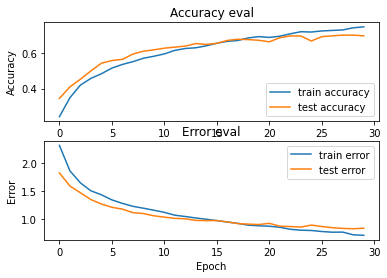

In [96]:
# plot accuracy/error for training and validation
plot_history(history)

In [97]:
# evaluate model on test set
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print('\nTest accuracy:', test_acc)

79/79 - 1s - loss: 0.8362 - accuracy: 0.7059 - 841ms/epoch - 11ms/step

Test accuracy: 0.7058823704719543


In [98]:
model.save("Music_Genre_10_CNN")

In [99]:
model.save("Music_Genre_10_CNN.h5")

In [100]:
# It can be used to reconstruct the model identically.
reconstructed_model = keras.models.load_model("Music_Genre_10_CNN.h5")

Prediction on Test Set

In [101]:
# pick a sample to predict from the test set
X_to_predict = X_test[80]
y_to_predict = y_test[80]

In [102]:
X_to_predict.shape

(130, 13, 1)

In [103]:
print("Real Genre:", y_to_predict)

Real Genre: 2


In [104]:
# add a dimension to input data for sample - model.predict() expects a 4d array in this case
X_to_predict = X_to_predict[np.newaxis, ...] # array shape (1, 130, 13, 1)

In [105]:
X_to_predict.shape

(1, 130, 13, 1)

In [106]:
# perform prediction
prediction = model.predict(X_to_predict)

1/1 [==============================] - 0s 104ms/step


In [107]:
# get index with max value
predicted_index = np.argmax(prediction, axis=1)

print("Predicted Genre:", int(predicted_index))

Predicted Genre: 2


In [108]:
# pick a sample to predict from the test set
X_to_predict = X_test[90]
y_to_predict = y_test[90]

print("Real Genre:", y_to_predict)

X_to_predict = X_to_predict[np.newaxis, ...]

prediction = model.predict(X_to_predict)

# get index with max value
predicted_index = np.argmax(prediction, axis=1)

print("Predicted Genre:", int(predicted_index))

Real Genre: 4
1/1 [==============================] - 0s 23ms/step
Predicted Genre: 4


In [109]:
len(X_test)

2499

In [110]:
for n in range(10):

  i = random.randint(0,len(X_test))
  # pick a sample to predict from the test set
  X_to_predict = X_test[i]
  y_to_predict = y_test[i]

  print("\nReal Genre:", y_to_predict)

  X_to_predict = X_to_predict[np.newaxis, ...]

  prediction = model.predict(X_to_predict)

  # get index with max value
  predicted_index = np.argmax(prediction, axis=1)

  print("Predicted Genre:", int(predicted_index))


Real Genre: 2
1/1 [==============================] - 0s 26ms/step
Predicted Genre: 2

Real Genre: 4
1/1 [==============================] - 0s 28ms/step
Predicted Genre: 4

Real Genre: 4
1/1 [==============================] - 0s 25ms/step
Predicted Genre: 4

Real Genre: 7
1/1 [==============================] - 0s 22ms/step
Predicted Genre: 3

Real Genre: 1
1/1 [==============================] - 0s 23ms/step
Predicted Genre: 1

Real Genre: 4
1/1 [==============================] - 0s 32ms/step
Predicted Genre: 4

Real Genre: 5
1/1 [==============================] - 0s 28ms/step
Predicted Genre: 9

Real Genre: 6
1/1 [==============================] - 0s 24ms/step
Predicted Genre: 3

Real Genre: 4
1/1 [==============================] - 0s 23ms/step
Predicted Genre: 0

Real Genre: 8
1/1 [==============================] - 0s 23ms/step
Predicted Genre: 5


Prediction on New Songs

In [111]:
# Audio files pre-processing
def process_input(audio_file, track_duration):

  SAMPLE_RATE = 22050
  NUM_MFCC = 13
  N_FTT=2048
  HOP_LENGTH=512
  TRACK_DURATION = track_duration # measured in seconds
  SAMPLES_PER_TRACK = SAMPLE_RATE * TRACK_DURATION
  NUM_SEGMENTS = 10

  samples_per_segment = int(SAMPLES_PER_TRACK / NUM_SEGMENTS)
  num_mfcc_vectors_per_segment = math.ceil(samples_per_segment / HOP_LENGTH)

  signal, sample_rate = librosa.load(audio_file, sr=SAMPLE_RATE)
  
  for d in range(10):

    # calculate start and finish sample for current segment
    start = samples_per_segment * d
    finish = start + samples_per_segment

    # extract mfcc
    mfcc = librosa.feature.mfcc(signal[start:finish], sample_rate, n_mfcc=NUM_MFCC, n_fft=N_FTT, hop_length=HOP_LENGTH)
    mfcc = mfcc.T

    return mfcc

In [112]:
genre_dict = {0:"hiphop",1:"country",2:"jazz",3:"classical",4:"metal",5:"pop",6:"rock",7:"blues",8:"reggae",9:"disco"}

First - country song

In [113]:
IPython.display.Audio("/content/drive/MyDrive/Dataset/own songs/Hank Williams - Hey, Good Lookin' (Lyrics).mp3")

In [114]:
new_input_mfcc = process_input("/content/drive/MyDrive/Dataset/own songs/Hank Williams - Hey, Good Lookin' (Lyrics).mp3", 30)

In [115]:
type(new_input_mfcc)

numpy.ndarray

In [116]:
new_input_mfcc.shape

(130, 13)

In [117]:
X_to_predict = new_input_mfcc[np.newaxis, ..., np.newaxis]
X_to_predict.shape

(1, 130, 13, 1)

In [118]:
prediction = model.predict(X_to_predict)

# get index with max value
predicted_index = np.argmax(prediction, axis=1)
print("Song Genre: Country")
print("Predicted Genre:", genre_dict[int(predicted_index)])

1/1 [==============================] - 0s 28ms/step
Song Genre: Country
Predicted Genre: country


Second song - rock


In [119]:
IPython.display.Audio("/content/drive/MyDrive/Dataset/own songs/Queen - Bohemian Rhapsody (with lyrics).mp3")

In [120]:
new_input_mfcc = process_input("/content/drive/MyDrive/Dataset/own songs/Queen - Bohemian Rhapsody (with lyrics).mp3", 30)

In [121]:
type(new_input_mfcc)

numpy.ndarray

In [122]:
X_to_predict = new_input_mfcc[np.newaxis, ..., np.newaxis]
X_to_predict.shape

(1, 130, 13, 1)

In [123]:
prediction = model.predict(X_to_predict)

# get index with max value
predicted_index = np.argmax(prediction, axis=1)
print("Song Genre: rock and classical")
print("Predicted Genre:", genre_dict[int(predicted_index)])

1/1 [==============================] - 0s 24ms/step
Song Genre: rock
Predicted Genre: rock
